# Project C122

## Getting Data

In [4]:
import numpy
import pandas

x = numpy.load('image.npz')['arr_0']
y = pandas.read_csv("https://raw.githubusercontent.com/whitehatjr/datasets/master/C%20122-123/labels.csv")["labels"]

classes = ['A', 'B', 'C', 'D', 'E','F', 'G', 'H', 'I', 'J', "K", "L", "M", "N", "O", "P", "Q", "R", "S", "T", "U", "V", "W", "X", "Y", "Z"]
n_classes = len(classes)

V    550
B    550
N    550
T    550
P    550
R    550
E    550
J    550
Z    550
D    550
O    550
A    550
H    550
K    550
Y    550
M    550
L    550
W    550
I    550
G    550
U    550
S    550
X    550
C    550
F    550
Q    550
Name: labels, dtype: int64


## Train Test Split and Scaling

In [6]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=9, train_size=7500, test_size=2500)
x_train_scaled = x_train/255.0
x_test_scaled = x_test/255.0

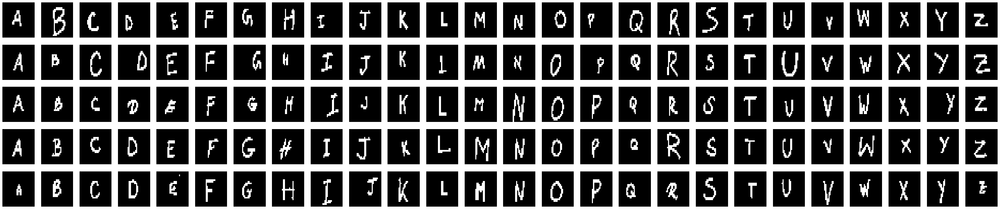

In [12]:
samples_per_class = 5
figure = plt.figure(figsize=(n_classes*2, (1+samples_per_class*2)))

idx_cls = 0
for cls in classes:
    idxs = numpy.flatnonzero(y == cls)
    idxs = numpy.random.choice(idxs, samples_per_class, replace=False)
    i = 0
    for idx in idxs:
        plt_idx = i * n_classes + idx_cls + 1
        p = plt.subplot(samples_per_class, n_classes, plt_idx)
        p = seaborn.heatmap(numpy.reshape(x[idx], (22, 30)), cmap=plt.cm.gray,
                            xticklabels=False, yticklabels=False, cbar=False)
        p = plt.axis('off')
        i += 1
    idx_cls += 1

## Logistic Regression

In [14]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(solver='saga', multi_class='multinomial')
log_reg.fit(x_train_scaled, y_train)

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


LogisticRegression(multi_class='multinomial', solver='saga')

In [17]:
from sklearn.metrics import accuracy_score

prediction = log_reg.predict(x_test_scaled)

accuracy = accuracy_score(y_test, prediction)
print(accuracy)

0.9952


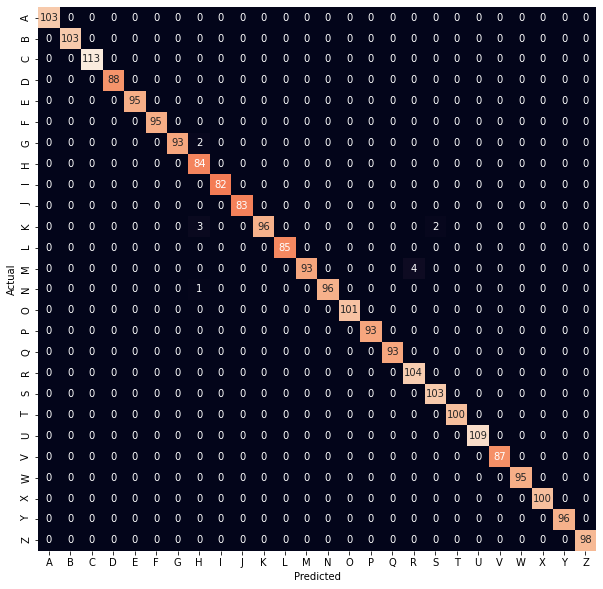

In [20]:
confusion_matrix = pandas.crosstab(y_test, prediction, rownames=['Actual'], colnames=['Predicted'])

p = plt.figure(figsize=(10,10));
p = seaborn.heatmap(confusion_matrix, annot=True, fmt="d", cbar=False)